In [2]:
import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np
from scipy.signal import freqz


import pomozne as lib


In [2]:
input_name = "01"


In [3]:
audio_path = "./posnetki/" + input_name + ".wav"
audio_ref_path = "./posnetki/" + input_name + "_ref.wav"
audio_ref_day_path = "./posnetki/" + input_name + "_ref_day.wav"
audio_short_path = "./posnetki/" + input_name + "_trimmed.wav"


# Osnovne nastavitve in izris podatkov


In [4]:
cut_f_min = 45
cut_f_max = 55


In [5]:
sr = 400
SAMPLE_RATE = sr
audio_ref, _ = librosa.load(audio_ref_path, sr)
audio_ref_day, _ = librosa.load(audio_ref_day_path, sr)
audio, _ = librosa.load(audio_path, sr)
audio_short, _ = librosa.load(audio_short_path, sr)


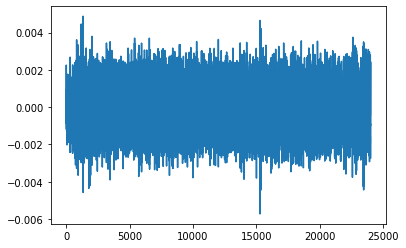

In [6]:
# Izris posnetka
plt.plot(audio_short)



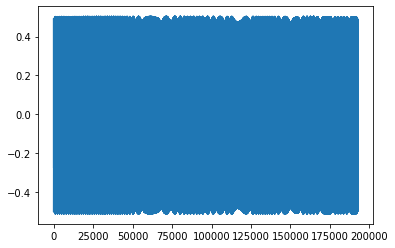

In [7]:
# Izris posnetka ENF
plt.plot(audio_ref)


# Frekvenčna analiza vhodnih podatkov (FFT)


**Določitev frekvence vzorčenja**: določena kot frekvenca vzorčenja meritve. Posnetek je temu primerno "resemplan".


## Frekvenčna analiza audio posnetka


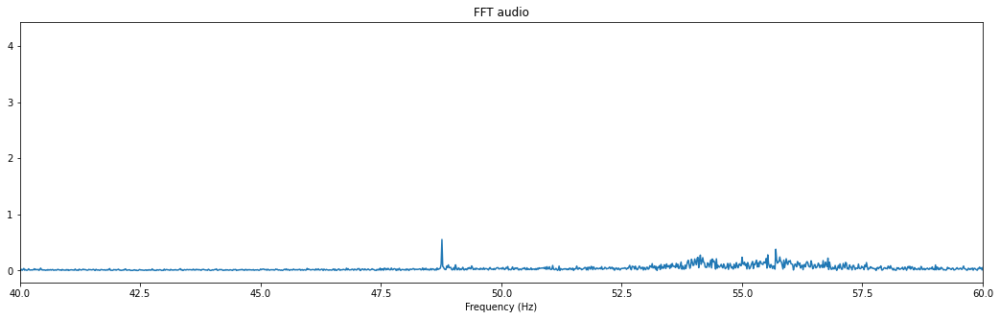

In [12]:
X = np.fft.fft(audio)

audio_f, audio_mag = lib.plot_magnitude_spectrum(
    audio_short, SAMPLE_RATE, "FFT audio", 40, 60)
plt.show()


## Frekvenčna analiza meritve


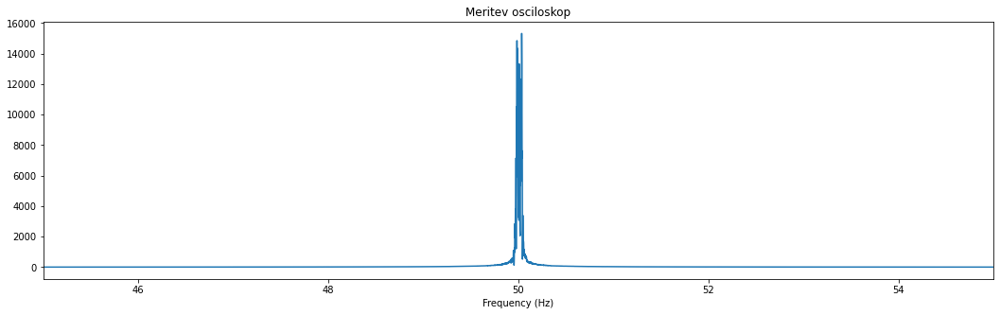

In [30]:
ref_f, ref_mag = lib.plot_magnitude_spectrum(
    audio_ref, SAMPLE_RATE, "Meritev osciloskop", cut_f_min, cut_f_max)


# Spektogramska analiza


## Spektogramska analiza posnetka


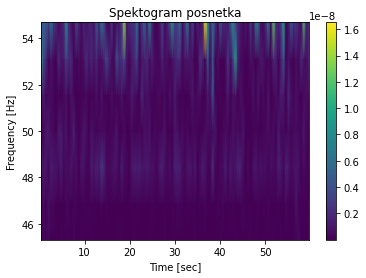

In [25]:
audio_avg = np.average(audio)
audio_x = []
for x in audio:
    audio_x.append(x - audio_avg)

lib.specgram(np.array(audio_short), sr, title="Spektogram posnetka", fmin = cut_f_min, fmax=cut_f_max)


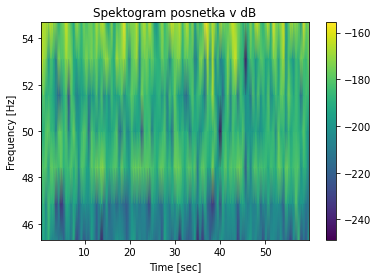

In [26]:
lib.specgram(audio_short, sr, dB=True, title="Spektogram posnetka v dB", fmin = cut_f_min, fmax=cut_f_max)


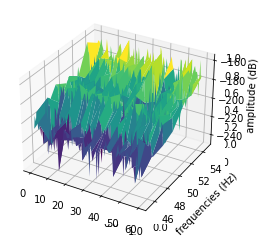

In [27]:
fig2, ax2 = plt.subplots(subplot_kw={'projection': '3d'})
lib.specgram3d(audio_short, fs=sr, fmin=cut_f_min, fmax=cut_f_max, dB=True)
plt.show()


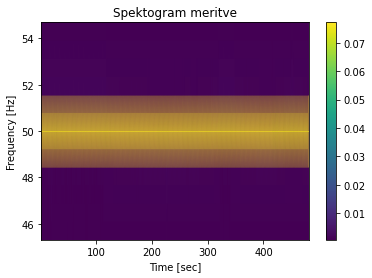

In [17]:
lib.specgram(audio_ref, sr, fmin=cut_f_min,
             fmax=cut_f_max, title="Spektogram meritve")


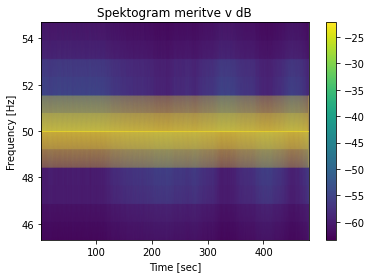

In [18]:
lib.specgram(audio_ref, sr, dB=True, title="Spektogram meritve v dB", fmin=cut_f_min,
             fmax=cut_f_max,)


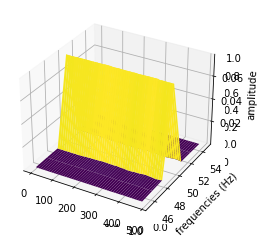

In [19]:
fig2, ax2 = plt.subplots(subplot_kw={'projection': '3d'})
lib.specgram3d(np.array(audio_ref), fs=sr,
               fmin=cut_f_min, fmax=cut_f_max, dB=False)
plt.show()


# Uporaba filtrov


## Izbira filtra in nastavitev filtra

Izberemo _bandpass Butterworth filter_. Z filtrom želimo opraviti filtriranje vseh signalov, ki se ne nahajajo v pasu osnovne frkevnece ENF ali njenih harmonikov, pri čemer dopuščamo tudi frekvence v bližnji okolici.

Iz spodnjega grafa razberemo, da je smiselno izbrati _order = 2_.


In [ ]:
fs = SAMPLE_RATE
lowcut = cut_f_min
highcut = cut_f_max

# Plot the frequency response for a few different orders.
plt.figure(1)
plt.clf()
for order in [2, 3, 6, 9]:
    b, a = lib.butter_bandpass(lowcut, highcut, fs, order=order)
    w, h = freqz(b, a, worN=2000)
    plt.plot((fs * 0.5 / np.pi) * w, abs(h), label="order = %d" % order)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Gain')
plt.grid(True)
plt.legend(loc='best')


In [21]:
filter_order = 8


## Uporaba filtra na avdio posnetku


(array([0.00000000e+00, 1.66673611e-02, 3.33347223e-02, ...,
        3.99966665e+02, 3.99983333e+02, 4.00000000e+02]),
 array([4.21318679e-05, 4.21318728e-05, 4.21318877e-05, ...,
        4.21319125e-05, 4.21318877e-05, 4.21318728e-05]))

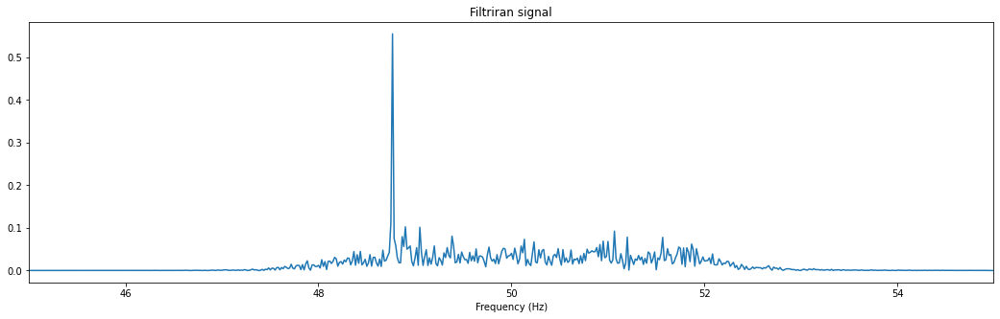

In [28]:
audio_filter = lib.butter_bandpass_filter(
    audio_short, 48, 52, SAMPLE_RATE, order=filter_order)

lib.plot_magnitude_spectrum(
    audio_filter, SAMPLE_RATE, "Filtriran signal", 45, 55)

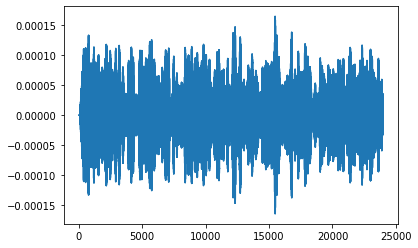

In [31]:
plt.plot(audio_filter)

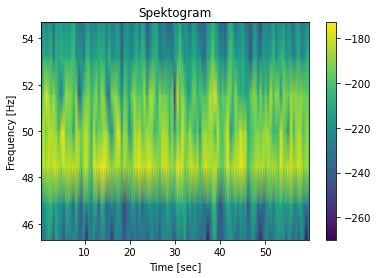

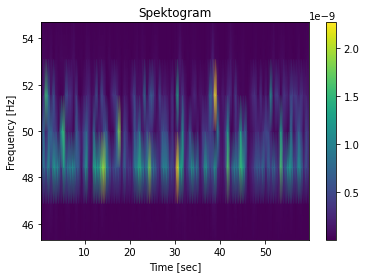

In [32]:
lib.specgram(audio_filter, SAMPLE_RATE,
             fmin=cut_f_min, fmax=cut_f_max, dB=True)
lib.specgram(audio_filter, SAMPLE_RATE, fmin=cut_f_min, fmax=cut_f_max)


In [33]:
audio_fx = []
audio_filter_avg = np.average(audio_filter)

print(audio_filter_avg)

for af in audio_filter:
  audio_fx.append(af - audio_filter_avg)

1.755494495541329e-09


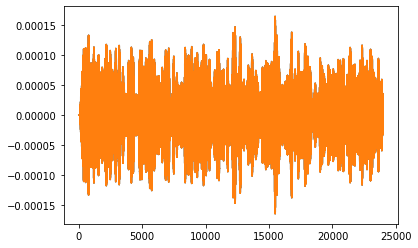

In [34]:
# plt.plot(audio_filter[500:10000])
plt.plot(audio_filter)
plt.plot(audio_fx)


168801
0 [0.00604325]
1 [-0.04182107]
2 [-0.06515037]
3 [-0.05026446]
4 [-0.00589224]
5 [0.04193764]
6 [0.06516394]
7 [0.05016718]
8 [0.00574125]
9 [-0.04205391]
10 [-0.06517741]
11 [-0.05006982]
12 [-0.00559014]
13 [0.0421699]
14 [0.06519013]
15 [0.049972]
16 [0.0054392]
17 [-0.04228557]
18 [-0.06520277]
19 [-0.04987404]
20 [-0.00528802]
21 [0.04240101]
22 [0.0652146]
23 [0.04977544]
24 [0.00513691]
25 [-0.04251617]
26 [-0.06522637]
27 [-0.04967679]
28 [-0.00498563]
29 [0.04263111]
30 [0.06523741]
31 [0.04957757]
32 [0.0048344]
33 [-0.04274582]
34 [-0.06524843]
35 [-0.04947828]
36 [-0.00468296]
37 [0.04286033]
38 [0.06525871]
39 [0.04937842]
40 [0.00453154]
41 [-0.04297469]
42 [-0.065269]
43 [-0.04927842]
44 [-0.00437981]
45 [0.04308894]
46 [0.06527861]
47 [0.04917787]
48 [0.00422807]
49 [-0.04320306]
50 [-0.06528828]
51 [-0.04907723]
52 [-0.00407606]
53 [0.04331704]
54 [0.06529727]
55 [0.04897608]
56 [0.00392406]
57 [-0.04343096]
58 [-0.06530632]
59 [-0.04887475]
60 [-0.00377166]
61 

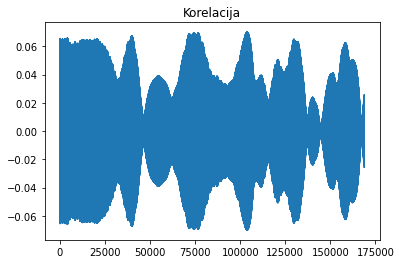

In [36]:
def enotski(v):
  return  v / np.sqrt(np.sum(v**2))


def korelacija(data, sample):
  sample_avg = np.average(sample)
  sample_dev = np.std(sample)

  sample_l = len(sample)
  n = len(data) - len(sample)
  print(n)

  corr = []

  for i in range(0, n):
    zac = i
    kon = zac + sample_l
    
    data_window = np.array(data[zac:kon])
    s = np.array(sample)

    c = np.correlate(enotski(data_window), enotski(s))
    corr.append(c)

    print(i, c)

  return corr


corr = korelacija(audio_ref, audio_fx)

plt.plot(range(0, len(corr)), corr)
plt.title("Korelacija")
plt.show()

168801
0 [0.7237313]
1 [0.72363186]
2 [0.7242346]
3 [0.7243821]
4 [0.7235247]
5 [0.72340196]
6 [0.7242315]
7 [0.72445405]
8 [0.72371405]
9 [0.7236141]
10 [0.724226]
11 [0.72437394]
12 [0.7234955]
13 [0.72337973]
14 [0.72423375]
15 [0.7244499]
16 [0.72369957]
17 [0.72360146]
18 [0.7242247]
19 [0.7243719]
20 [0.72348535]
21 [0.7233647]
22 [0.7242298]
23 [0.7244463]
24 [0.72367716]
25 [0.7235832]
26 [0.72421473]
27 [0.7243663]
28 [0.7234607]
29 [0.7233449]
30 [0.72422576]
31 [0.72444093]
32 [0.723663]
33 [0.72356164]
34 [0.72420365]
35 [0.72436416]
36 [0.7234386]
37 [0.72331643]
38 [0.7242174]
39 [0.7244389]
40 [0.72364086]
41 [0.72354925]
42 [0.7241957]
43 [0.724352]
44 [0.72340906]
45 [0.7232922]
46 [0.7242072]
47 [0.72443104]
48 [0.7236266]
49 [0.7235292]
50 [0.72418463]
51 [0.7243491]
52 [0.7233889]
53 [0.723272]
54 [0.7241965]
55 [0.72441924]
56 [0.7236008]
57 [0.72351]
58 [0.7241775]
59 [0.7243414]
60 [0.7233646]
61 [0.7232555]
62 [0.7241862]
63 [0.72440416]
64 [0.72358596]
65 [0.72

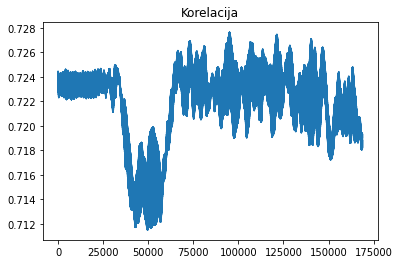

In [42]:
mag_audio_ref = np.abs(audio_ref)
mag_audio_short = np.abs(audio_short)

corr = korelacija(mag_audio_ref, mag_audio_short)

plt.plot(range(0, len(corr)), corr)
plt.title("Korelacija")
plt.show()

[array([0.7237313], dtype=float32), array([0.7228456], dtype=float32), array([0.7156193], dtype=float32), array([0.7253971], dtype=float32), array([0.7213949], dtype=float32), array([0.7195666], dtype=float32), array([0.7183643], dtype=float32), array([0.71965533], dtype=float32)]


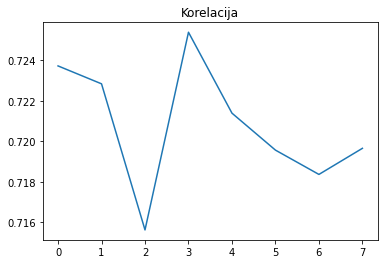

In [44]:
def enotski(v):
  return  v / np.sqrt(np.sum(v**2))


def korelacija(data, sample):
  sample_l = len(sample)
  n = int(len(data) / sample_l)

  corr = []

  for i in range(0, n):
    zac = i * sample_l
    kon = zac + sample_l
    
    data_window = np.array(data[zac:kon])
    s = np.array(sample)

    corr.append(np.correlate(enotski(data_window), enotski(s)))

  return corr


corr = korelacija(mag_audio_ref, mag_audio_short)


print(corr)

plt.plot(range(0, len(corr)), corr)
plt.title("Korelacija")
plt.show()